In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sympy as smp
import plotly 
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import pickle
import edist.ted as ted
from sklearn.preprocessing import MinMaxScaler

import sys
sys.path.append("../src")

import utils
import ExpressionTree

import re

sns.set_theme("notebook")

from importlib import reload

import RollingMetricAnalysisPipeline
reload(RollingMetricAnalysisPipeline)
from RollingMetricAnalysisPipeline import *

In [2]:
def t1(X):
    return 10*np.exp(-0.5*np.exp(-0.5*X + 2))
X1 = np.linspace(-5, 15, 140)
y1 = t1(X1)

def t2(X):
    return np.exp(-X)
X2 = np.linspace(1, 20, 140)
y2 = t2(X2)

air_passengers = pd.read_csv("data/AirPassengers.csv")
X3 = air_passengers.index
y3 = air_passengers["#Passengers"]

treated_seco = pd.read_csv("data/treated_seco.csv")
treated_seco

treated_seco["eventdate"] = pd.to_datetime(treated_seco["eventdate"])
treated_seco.set_index("eventdate", inplace=True, drop=True)
treated_seco = treated_seco.asfreq("7D")
treated_seco.rename(columns={"Unnamed: 0": "weeks"}, inplace=True)

X4_origin = treated_seco.weeks.values
y4_origin = treated_seco.value.values

X4 = treated_seco.weeks[::2].values
y4 = treated_seco.value[::2].values


# sugar = yf.Ticker("SB=F")
# sugar_history = sugar.history(period="1y")
# sugar_history = sugar_history.asfreq("B")

# # Interpolando os dados
# sugar_history = sugar_history.interpolate()

# sugar_history.reset_index(inplace=True)

sugar_data_manip = pd.read_csv("data/sugar_data_manip.csv")
X5 = sugar_data_manip.X.values
y5 = sugar_data_manip.y.values

data = [
    [X1, y1],
    [X2, y2],
    [X3, y3],
    [X4, y4],
    [X5, y5]
]

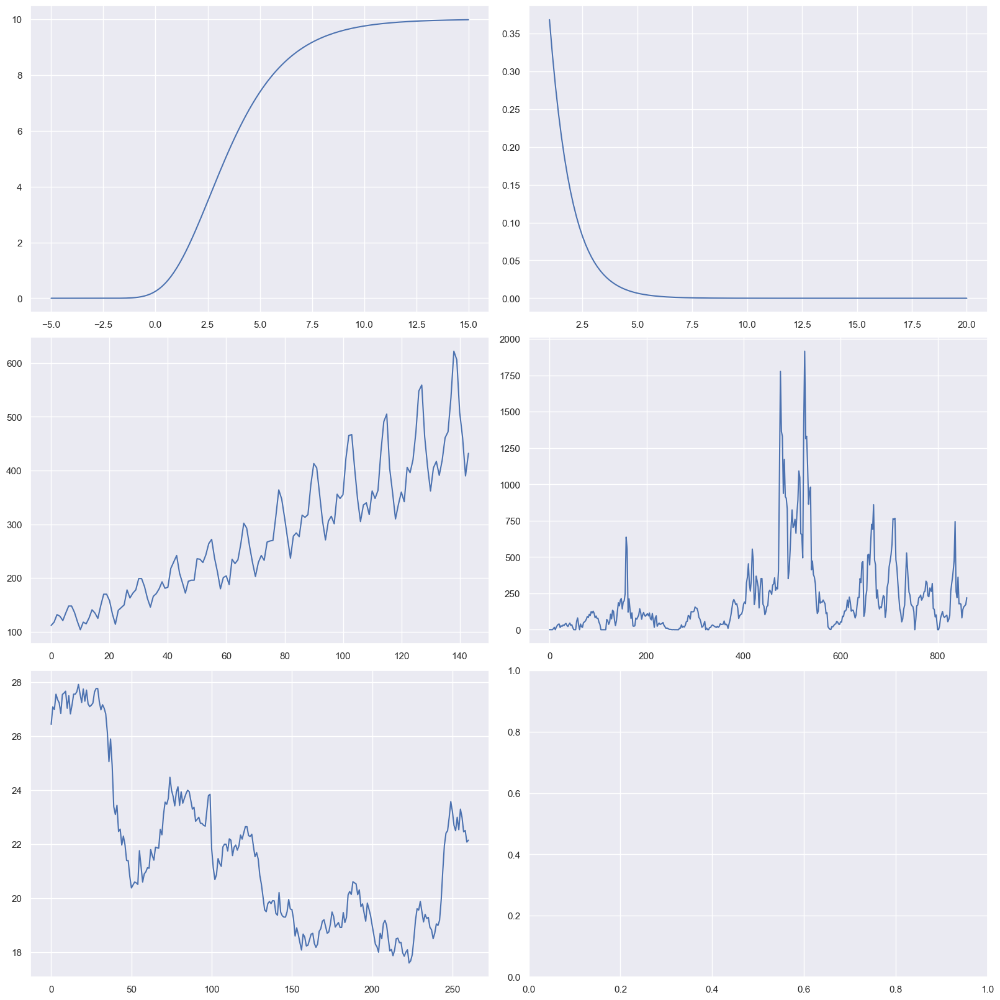

In [3]:
fig, axs = plt.subplots(3, 2, constrained_layout=True, figsize=(16, 16))

for ax, current_data in zip(axs.flatten(), data):
    ax.plot(current_data[0], current_data[1])

# Stable1

## 139-10

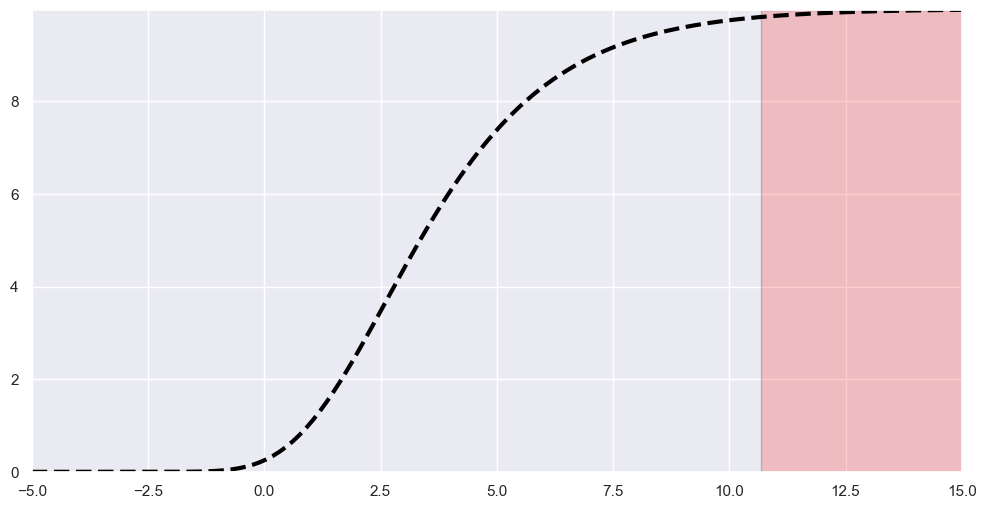

In [4]:
Pipeline = AnalysisPipeline(X1, y1, (0, 400))
Pipeline.create_df(rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Stable1\RollingMetric-139-110")
Pipeline.plot_data()

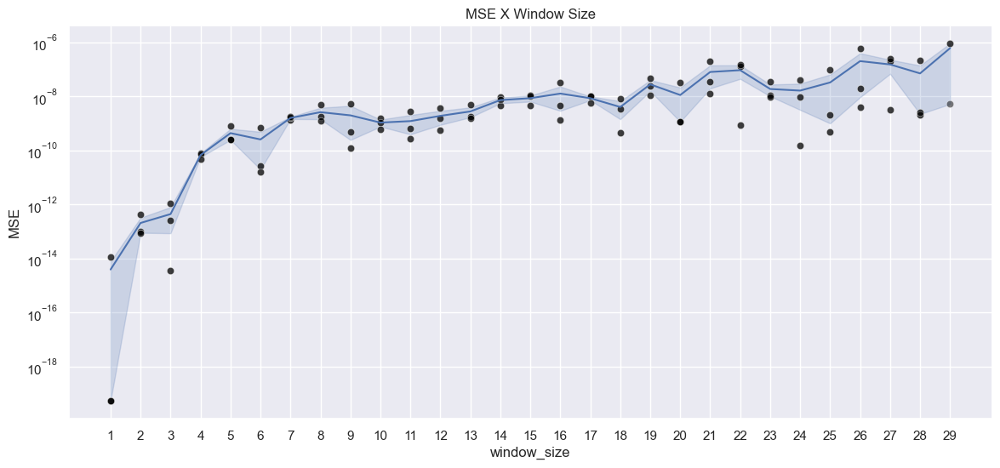

In [5]:
Pipeline.plot_MSE()

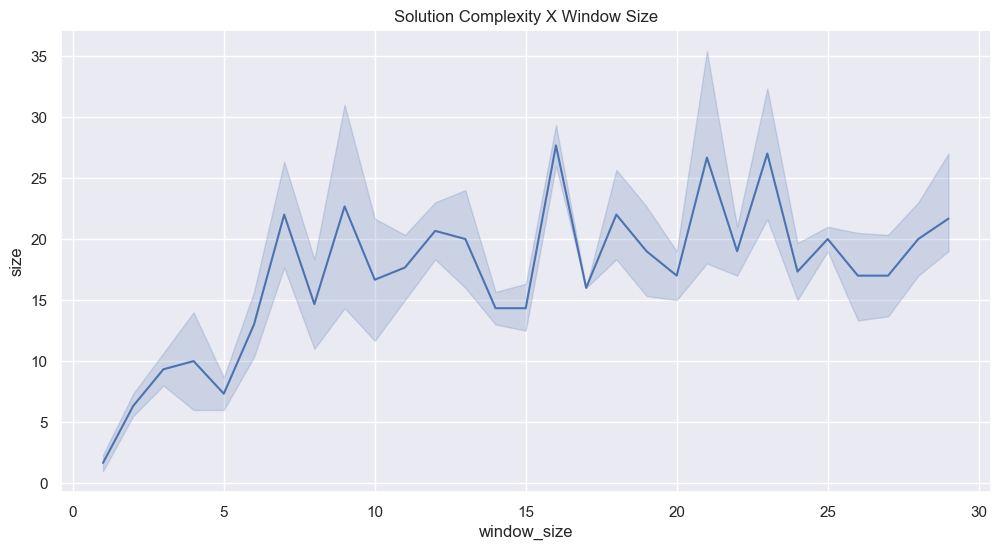

In [6]:
Pipeline.plot_complexity(style="line")

In [7]:
Pipeline.plot_solutions()
Pipeline.plot_solutions(filter_value=13)

In [8]:
Pipeline.progressively_plot_solutions()
Pipeline.progressively_plot_solutions(filter_value=13)

In [9]:
Pipeline.plot_variation(style="std")
Pipeline.plot_variation(style="std", filter_value=13)

### LSTM

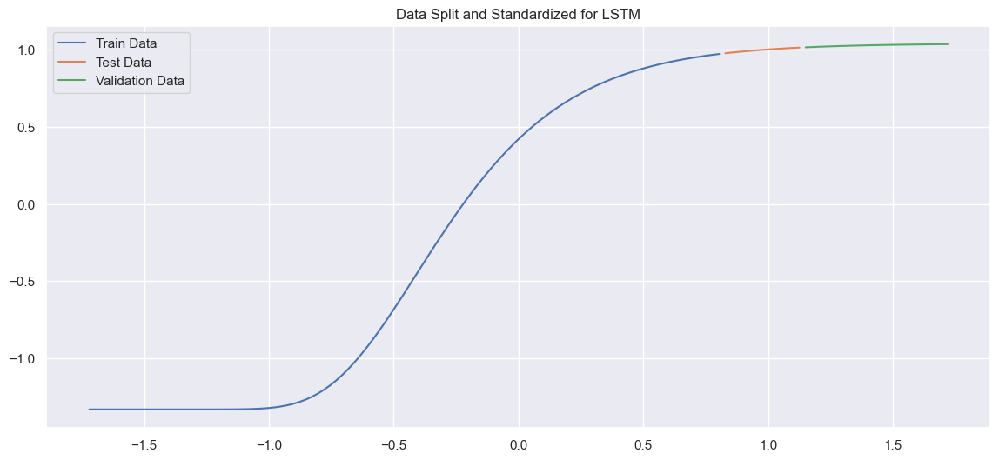

In [10]:
Pipeline.train_test_split()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 8)              │            16 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 657 (2.57 KB)

 Trainable params: 657 (2.57 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.9496
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9046
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7923 
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7693
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7257
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7319 
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7108
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6491
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.62799
Epoch 10/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5756
Epoch 11/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5862 
Epoch 12/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5229
Epoch 13/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4628
Epoch 14/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4310
Epoch 15/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3835
Epoch 16/100
4/4 ━━━━━━━━━━━━

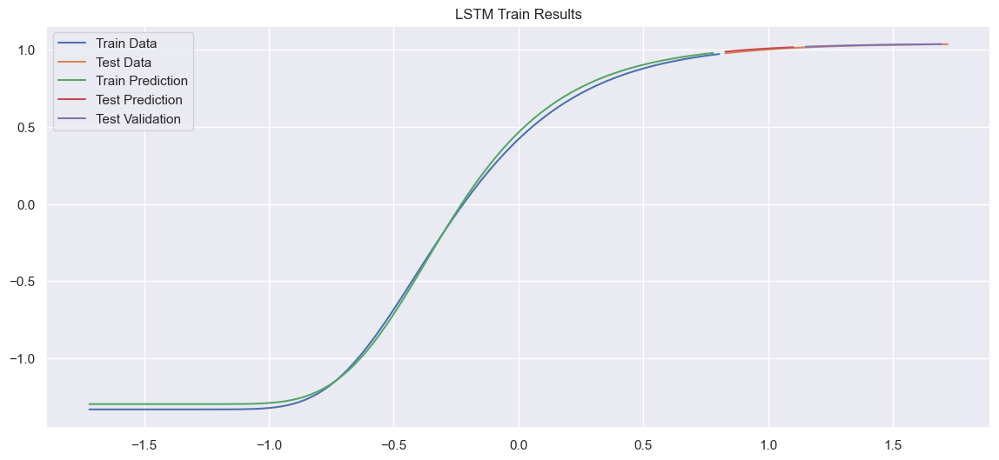

In [11]:
Pipeline.plot_LSTM_results()

## 80-51

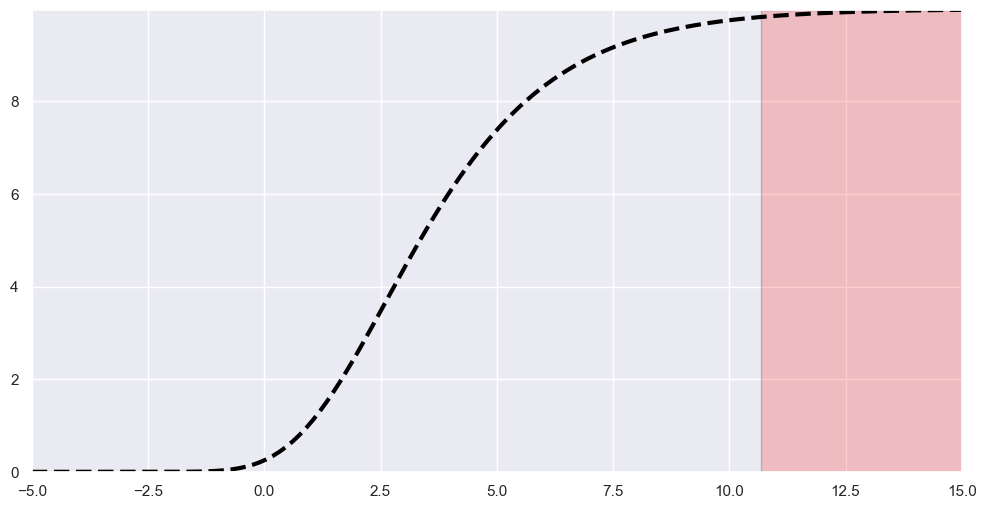

In [12]:
Pipeline = AnalysisPipeline(X1, y1, (0, 400))
Pipeline.create_df(rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Stable1\RollingMetric-139-110")
Pipeline.plot_data()

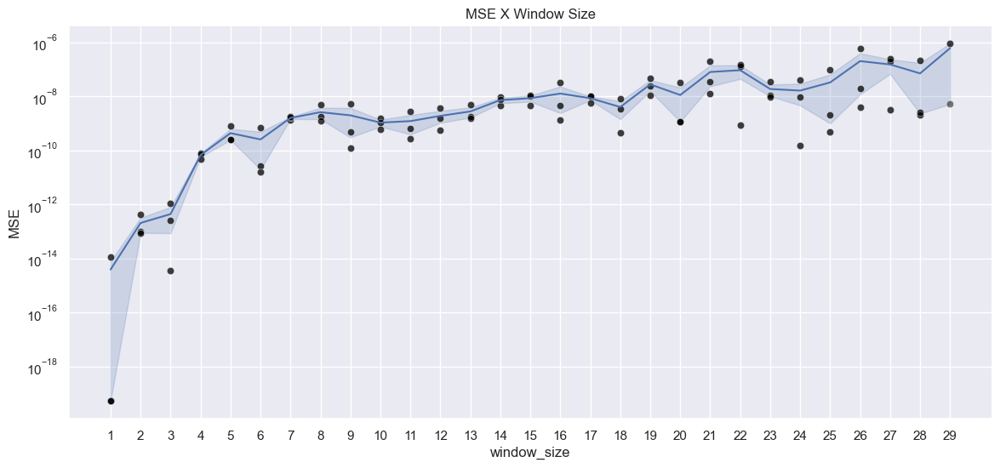

In [13]:
Pipeline.plot_MSE()

In [ ]:
Pipeline.plot_complexity(style="line")

In [ ]:
Pipeline.plot_solutions()
Pipeline.plot_solutions(filter_value=13)

In [ ]:
Pipeline.progressively_plot_solutions()
Pipeline.progressively_plot_solutions(filter_value=13)

In [ ]:
Pipeline.plot_variation(style="std")
Pipeline.plot_variation(style="std", filter_value=13)

### LSTM

In [ ]:
Pipeline.train_test_split()

In [ ]:
Pipeline.plot_LSTM_results()

## 30-1

In [ ]:
Pipeline = AnalysisPipeline(X1, y1, (0, 400))
Pipeline.create_df(rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Stable1\RollingMetric-30-1")
Pipeline.plot_data()

In [ ]:
Pipeline.plot_MSE()

In [ ]:
Pipeline.plot_complexity(style="line")

In [ ]:
Pipeline.plot_solutions()
Pipeline.plot_solutions(filter_value=9)

In [ ]:
Pipeline.progressively_plot_solutions()
Pipeline.progressively_plot_solutions(filter_value=9)

In [ ]:
Pipeline.plot_variation(style="std")
Pipeline.plot_variation(style="std", filter_value=9)

$## LSTM

In [ ]:
Pipeline.train_test_split()

In [ ]:
Pipeline.plot_LSTM_results()

# Stable2

## 80-69

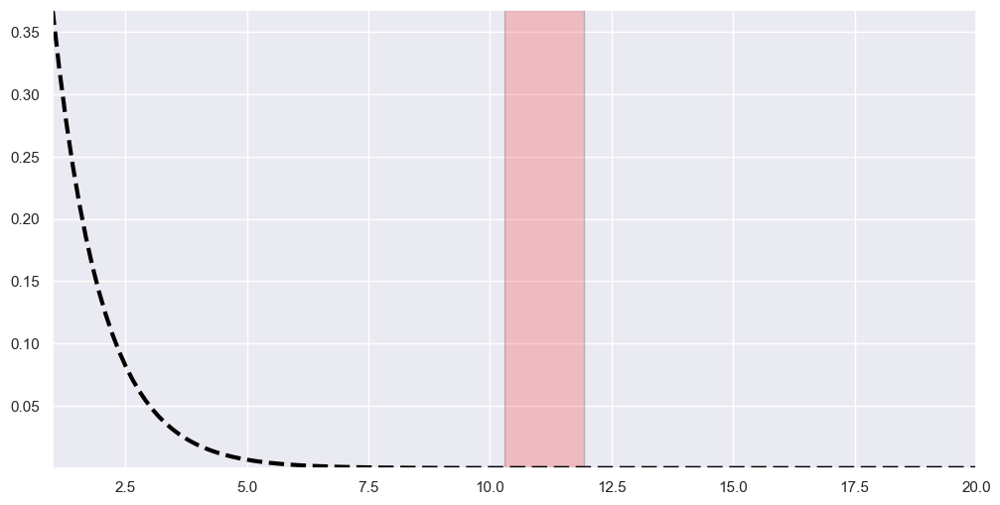

In [20]:
Pipeline = AnalysisPipeline(X2, y2, (0, 400))
Pipeline.create_df(rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Stable1\RollingMetric-80-69")
Pipeline.plot_data()

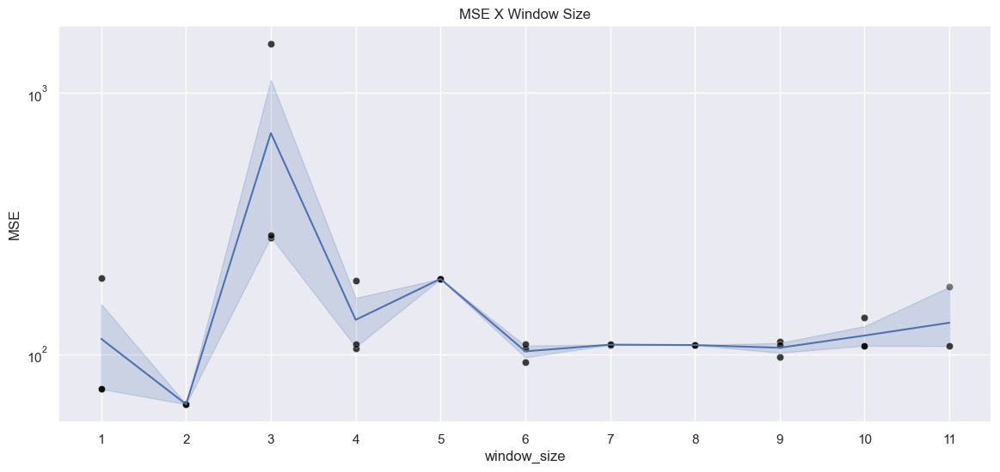

In [21]:
Pipeline.plot_MSE()

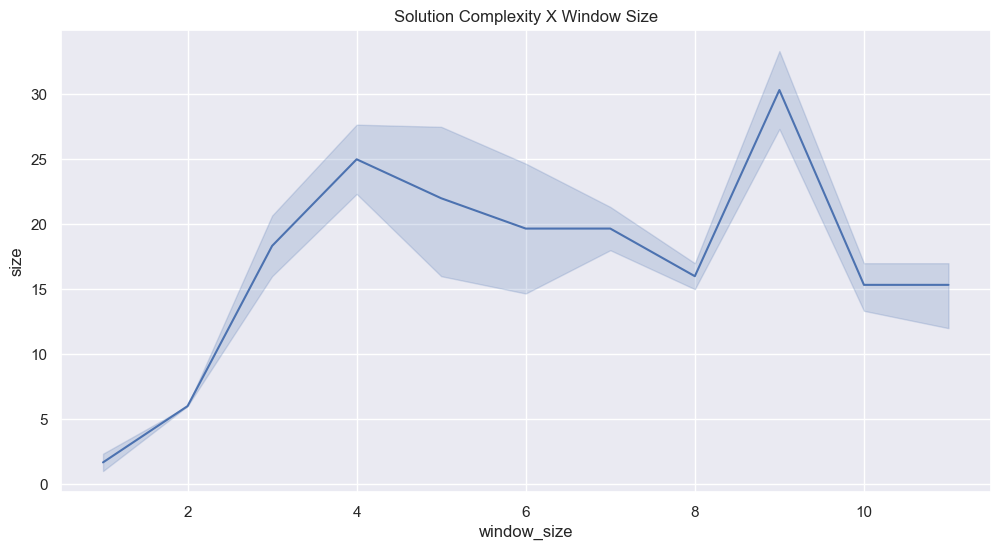

In [22]:
Pipeline.plot_complexity(style="line")

In [23]:
Pipeline.plot_solutions()
Pipeline.plot_solutions(filter_value=13)

In [24]:
Pipeline.progressively_plot_solutions()
Pipeline.progressively_plot_solutions(filter_value=13)

In [25]:
Pipeline.plot_variation(style="std")
Pipeline.plot_variation(style="std", filter_value=13)

### LSTM

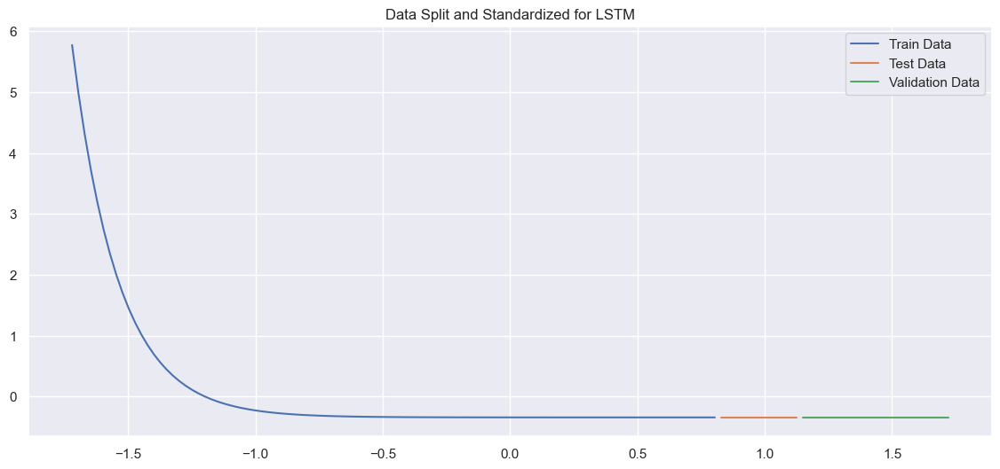

In [26]:
Pipeline.train_test_split()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 8)              │            16 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 657 (2.57 KB)

 Trainable params: 657 (2.57 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8764  
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9361 
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9392
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8562
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.8817 
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7571  
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8667
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8683  
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7157   
Epoch 10/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6718
Epoch 11/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6423
Epoch 12/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6263 
Epoch 13/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7606
Epoch 14/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6212  
Epoch 15/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6614
Epoch 16/100
4/4 ━━━

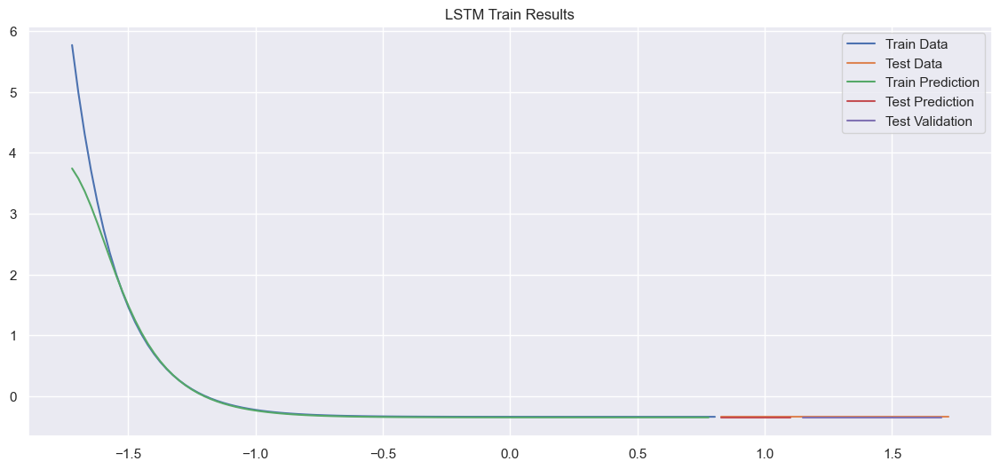

In [27]:
Pipeline.plot_LSTM_results()

## 80-51

In [ ]:
Pipeline = AnalysisPipeline(X1, y1, (0, 400))
Pipeline.create_df(rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Stable1\RollingMetric-139-110")
Pipeline.plot_data()

In [ ]:
Pipeline.plot_MSE()

In [ ]:
Pipeline.plot_complexity(style="line")

In [ ]:
Pipeline.plot_solutions()
Pipeline.plot_solutions(filter_value=13)

In [ ]:
Pipeline.progressively_plot_solutions()
Pipeline.progressively_plot_solutions(filter_value=13)

In [ ]:
Pipeline.plot_variation(style="std")
Pipeline.plot_variation(style="std", filter_value=13)

### LSTM

In [ ]:
Pipeline.train_test_split()

In [ ]:
Pipeline.plot_LSTM_results()

## 30-1

In [ ]:
Pipeline = AnalysisPipeline(X1, y1, (0, 400))
Pipeline.create_df(rf"E:\Documents\Coding\Repositorios\MyRepositories\Versatus\Janela_Movel\SRRollingMetric\Outputs\Stable1\RollingMetric-30-1")
Pipeline.plot_data()

In [ ]:
Pipeline.plot_MSE()

In [ ]:
Pipeline.plot_complexity(style="line")

In [ ]:
Pipeline.plot_solutions()
Pipeline.plot_solutions(filter_value=9)

In [ ]:
Pipeline.progressively_plot_solutions()
Pipeline.progressively_plot_solutions(filter_value=9)

In [ ]:
Pipeline.plot_variation(style="std")
Pipeline.plot_variation(style="std", filter_value=9)

$## LSTM

In [ ]:
Pipeline.train_test_split()

In [ ]:
Pipeline.plot_LSTM_results()